<a href="https://colab.research.google.com/github/mimingfikriac/ALIN_ImageCompressing_SVD/blob/main/Project_Image_Compressing_SVD_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**UAS TEORI MATRIKS DAN ALJABAR LINIER**
#**Kelompok 4**

#**1. Erlina Nita Sumadya (2206130712)**
#**2. Melza Rensiana (2306174980)**
#**3. Miming Fikria Camilla (2306288912)**

# **GRAYSCALE**

Rank of original matrix:  486


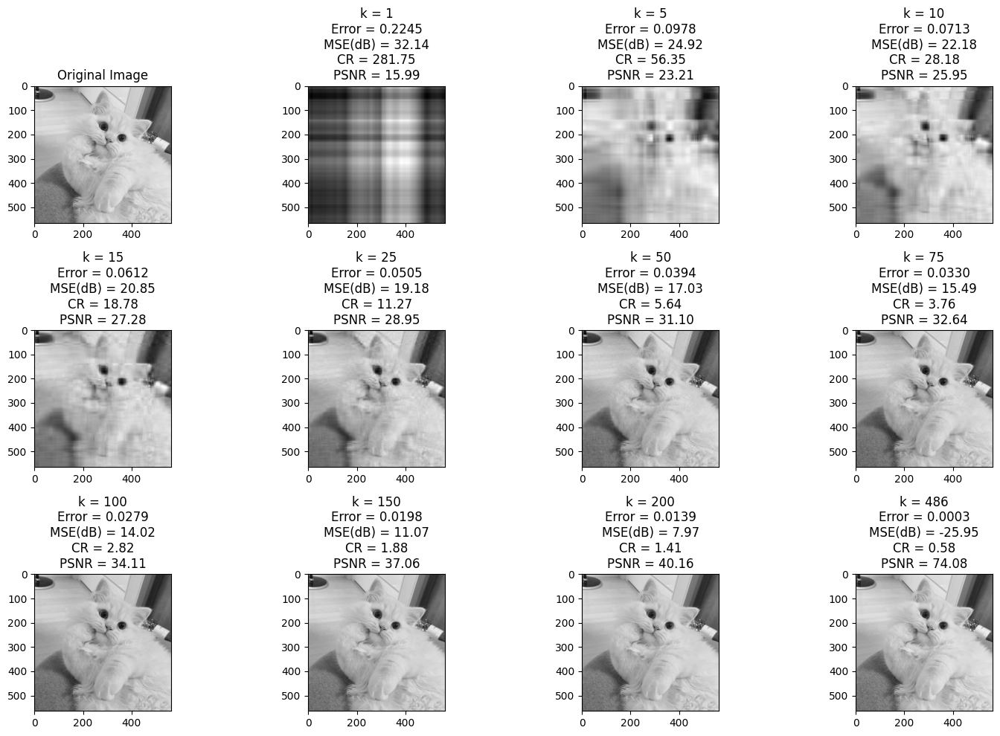

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# Step 1: Specify the image URL
img_url = 'https://i.pinimg.com/564x/4d/1a/1b/4d1a1b004d1e43cf656b43583c53cbf0.jpg'  # replace with your image URL

# Step 2: Load the image from the URL
response = requests.get(img_url)
img = Image.open(BytesIO(response.content))

# Step 3: Convert the image to grayscale
img_gray = img.convert('L')

# Step 4: Convert the grayscale image into numpy array
img_array = np.array(img_gray, dtype=np.float32)

# Step 5: Manual Singular Value Decomposition (SVD)
def manual_svd(matrix):
    # Calculate covariance matrix
    covariance_matrix = np.dot(matrix.T, matrix)

    # Calculate eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)
    eigenvalues[eigenvalues < 0] = 0

    # Sort eigenvalues in descending order
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    # Calculate singular values and singular vectors
    singular_values = np.sqrt(eigenvalues)
    singular_vectors = np.dot(matrix, eigenvectors)

    # Normalize singular vectors
    singular_vectors = singular_vectors / np.linalg.norm(singular_vectors, axis=0)

    return singular_vectors, singular_values, eigenvectors.T

# Step 6: Reconstruct the image using the top k singular values
def reconstruct_image(matrix, k):
    U, S, Vt = manual_svd(matrix)
    img_compressed = np.dot(U[:, :k], np.dot(np.diag(S[:k]), Vt[:k, :]))
    return img_compressed, U, S, Vt  # Return U, S, Vt

print("Rank of original matrix: ", np.linalg.matrix_rank(img_array))

# Step 7: Display the original and compressed images for comparison
plt.figure(figsize=(15, 10))
plt.subplot(3, 4, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Image')

# Display the error, plot, mean square error (dB), and compression ratio for different values of k
k_values = [1, 5, 10, 15, 25, 50, 75, 100, 150, 200, np.linalg.matrix_rank(img_array)]  # Updated k values
for i, k in enumerate(k_values, start=2):
    img_compressed, U, S, Vt = reconstruct_image(img_array, k)
    error = np.linalg.norm(img_array - img_compressed) / np.linalg.norm(img_array)
    mse = np.sum((img_array - img_compressed)**2) / float(img_array.size)
    mse_db = 10 * np.log10(mse)
    compression_ratio = (img_array.size) / float(U[:, :k].size + k + Vt[:k, :].size)

    # Calculate PSNR
    max_pixel_value = 255  # for an 8-bit grayscale image
    psnr = 10 * np.log10((max_pixel_value ** 2) / mse)

    plt.subplot(3, 4, i)
    plt.imshow(img_compressed, cmap='gray')
    plt.title('k = {}\nError = {:.4f}\nMSE(dB) = {:.2f}\nCR = {:.2f}\nPSNR = {:.2f}'.format(k, error, mse_db, compression_ratio, psnr))

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
from tabulate import tabulate  # Import tabulate


# Initialize lists to store results
table_data = []
headers = ["k", "Error", "MSE(dB)", "Compression Ratio", "PSNR(dB)"]

# Display the error, plot, mean square error (dB), and compression ratio for different values of k
for k in k_values:
    img_compressed, U, S, Vt = reconstruct_image(img_array, k)
    error = np.linalg.norm(img_array - img_compressed) / np.linalg.norm(img_array)
    mse = np.sum((img_array - img_compressed) ** 2) / float(img_array.size)
    mse_db = 10 * np.log10(mse)
    compression_ratio = (img_array.size) / float(U[:, :k].size + k + Vt[:k, :].size)

    # Calculate PSNR
    max_pixel_value = 255  # for an 8-bit grayscale image
    psnr = 10 * np.log10((max_pixel_value ** 2) / mse)

    # Append results to the table_data list
    table_data.append([k, error, mse_db, compression_ratio, psnr])

# Display the table
print(tabulate(table_data, headers=headers, tablefmt="pretty"))


+-----+------------------------+--------------------+--------------------+--------------------+
|  k  |         Error          |      MSE(dB)       | Compression Ratio  |      PSNR(dB)      |
+-----+------------------------+--------------------+--------------------+--------------------+
|  1  |  0.22453536093235016   | 32.14305468862491  | 281.75022143489815 | 15.987748920054196 |
|  5  |  0.09779614955186844   | 24.92379660824848  | 56.350044286979625 | 23.20700700043062  |
| 10  |  0.07133571803569794   | 22.183500498183278 | 28.175022143489812 | 25.947303110495827 |
| 15  |  0.061182476580142975  | 20.849902309318015 | 18.783348095659875 | 27.28090129936109  |
| 25  |  0.05049930885434151   | 19.183068559304903 | 11.270008857395926 | 28.947735049374202 |
| 50  |  0.03942191228270531   | 17.032112915250078 | 5.635004428697963  | 31.098690693429027 |
| 75  |   0.0329940989613533   | 15.486083274899041 | 3.756669619131975  | 32.644720333780064 |
| 100 |  0.02786632999777794   | 14.0189

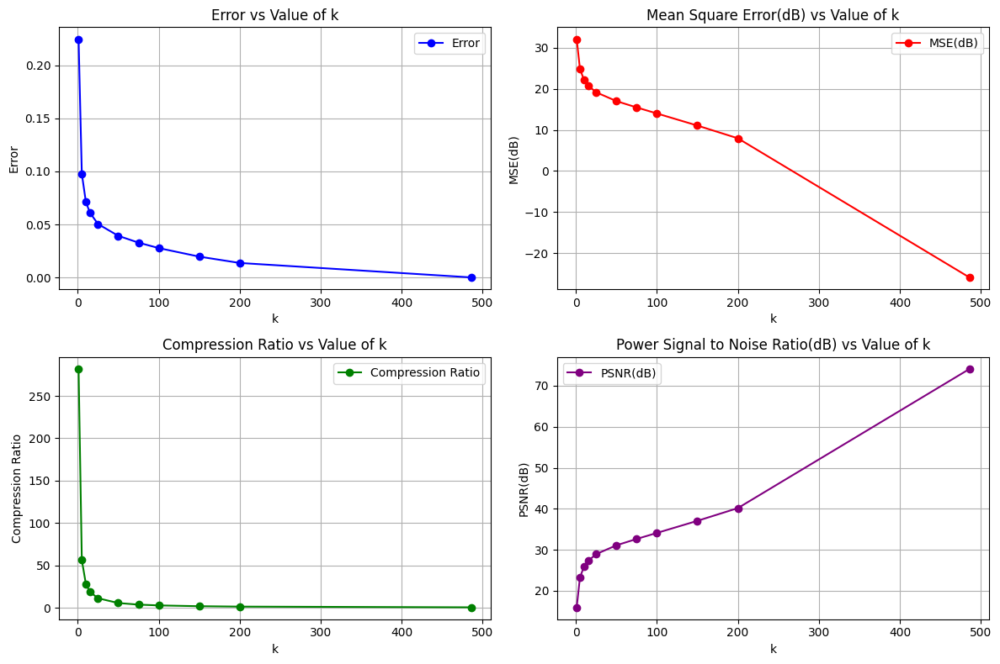

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tabulate import tabulate  # Import tabulate

# Assume you have defined k_values and reconstruct_image function

# Initialize lists to store results
table_data = []
headers = ["k", "Error", "MSE(dB)", "Compression Ratio", "PSNR(dB)"]

# Display the error, plot, mean square error (dB), and compression ratio for different values of k
for k in k_values:
    img_compressed, U, S, Vt = reconstruct_image(img_array, k)
    error = np.linalg.norm(img_array - img_compressed) / np.linalg.norm(img_array)
    mse = np.sum((img_array - img_compressed) ** 2) / float(img_array.size)
    mse_db = 10 * np.log10(mse)
    compression_ratio = (img_array.size) / float(U[:, :k].size + k + Vt[:k, :].size)

    # Calculate PSNR
    max_pixel_value = 255  # for an 8-bit grayscale image
    psnr = 10 * np.log10((max_pixel_value ** 2) / mse)

    # Append results to the table_data list
    table_data.append([k, error, mse_db, compression_ratio, psnr])

# Convert table_data to a NumPy array for easier indexing
table_data = np.array(table_data)

# Plotting

# Plot Error vs k
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(table_data[:, 0], table_data[:, 1], marker='o', label='Error', color='blue')
plt.title('Error vs Value of k')
plt.xlabel('k')
plt.ylabel('Error')
plt.grid(True)
plt.legend()

# Plot MSE(dB) vs k
plt.subplot(2, 2, 2)
plt.plot(table_data[:, 0], table_data[:, 2], marker='o', label='MSE(dB)', color='red')
plt.title('Mean Square Error(dB) vs Value of k')
plt.xlabel('k')
plt.ylabel('MSE(dB)')
plt.grid(True)
plt.legend()

# Plot Compression Ratio vs k
plt.subplot(2, 2, 3)
plt.plot(table_data[:, 0], table_data[:, 3], marker='o', label='Compression Ratio', color='green')
plt.title('Compression Ratio vs Value of k')
plt.xlabel('k')
plt.ylabel('Compression Ratio')
plt.grid(True)
plt.legend()

# Plot PSNR(dB) vs k
plt.subplot(2, 2, 4)
plt.plot(table_data[:, 0], table_data[:, 4], marker='o', label='PSNR(dB)', color='purple')
plt.title('Power Signal to Noise Ratio(dB) vs Value of k')
plt.xlabel('k')
plt.ylabel('PSNR(dB)')
plt.grid(True)
plt.legend()

# Adjust layout for better visualization
plt.tight_layout()

# Show the plots
plt.show()


In [ ]:
# Save the original grayscale image
img_gray.save('original_gray.png')

In [ ]:
# Define the k value
k = 486

# Perform SVD on the grayscale image array
U, S, Vt = np.linalg.svd(img_array)

# Reconstruct the grayscale image using the top k singular values
img_compressed_gray = np.dot(U[:,:k], np.dot(np.diag(S[:k]), Vt[:k,:]))

# Save the original grayscale image
img_gray.save('original_gray.png')

# Save the compressed grayscale image
Image.fromarray(img_compressed_gray.clip(0, 255).astype(np.uint8)).save('compressed_gray_{}.png'.format(k))

# **COLOUR**

Implementasi Dekomposisi Nilai Singular pada Image Compressing RGB

Rank of original red matrix:  486
Rank of original green matrix:  489
Rank of original blue matrix:  494


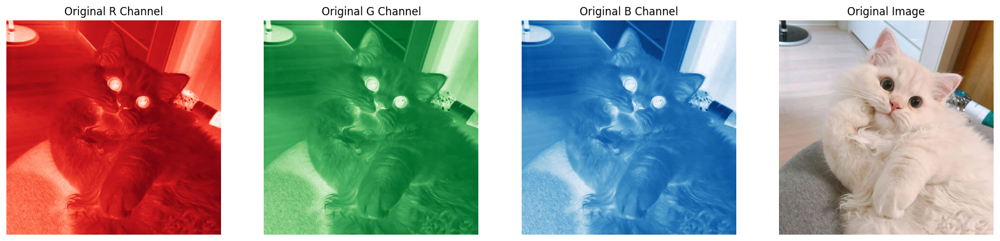

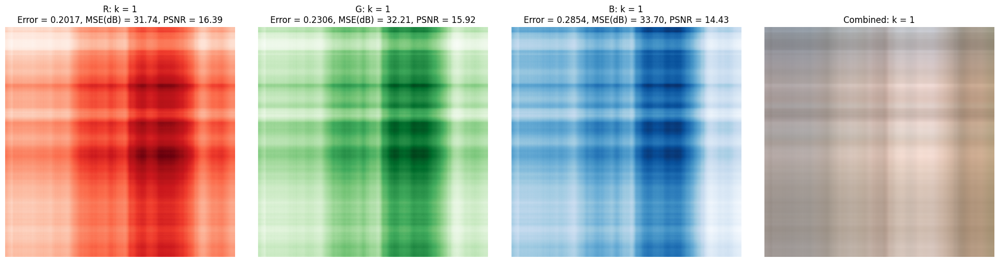

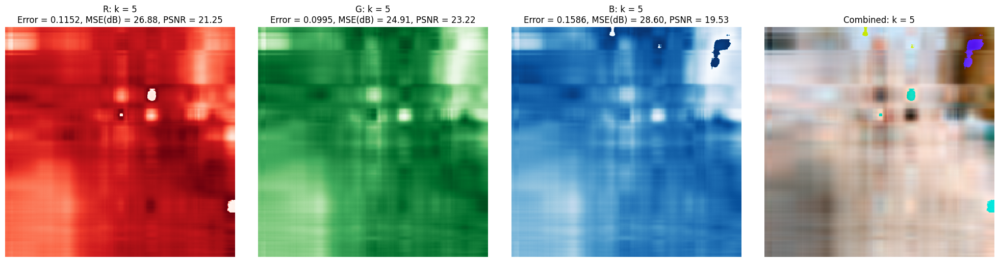

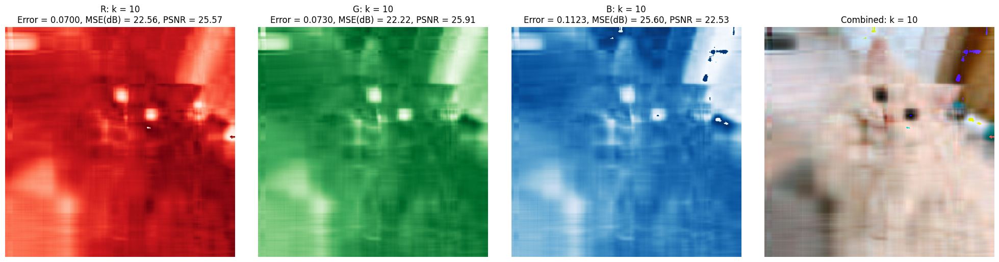

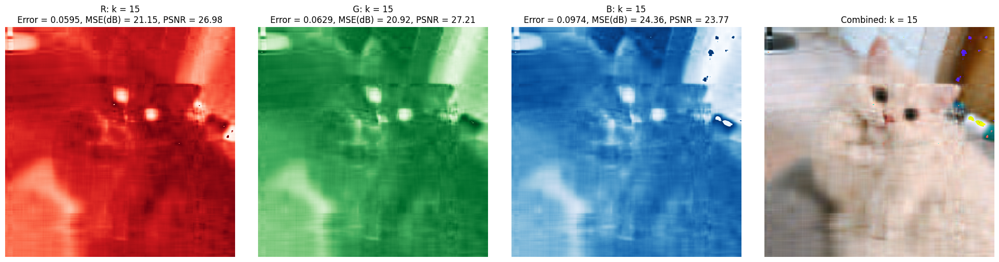

...

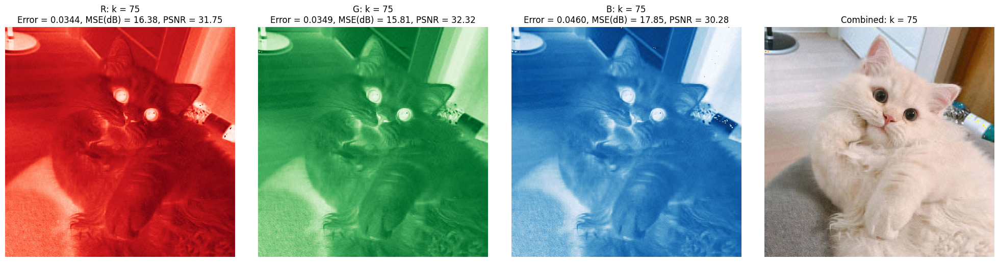

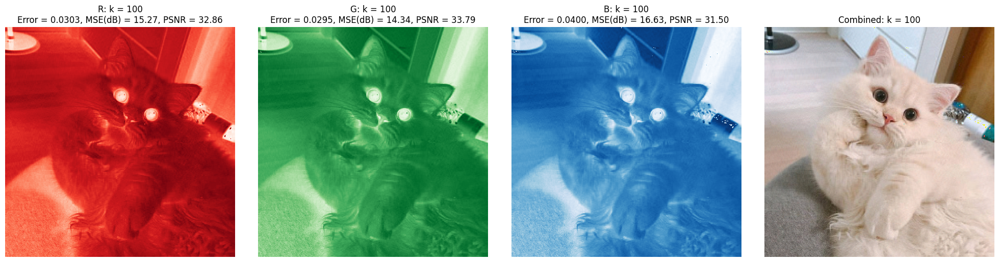

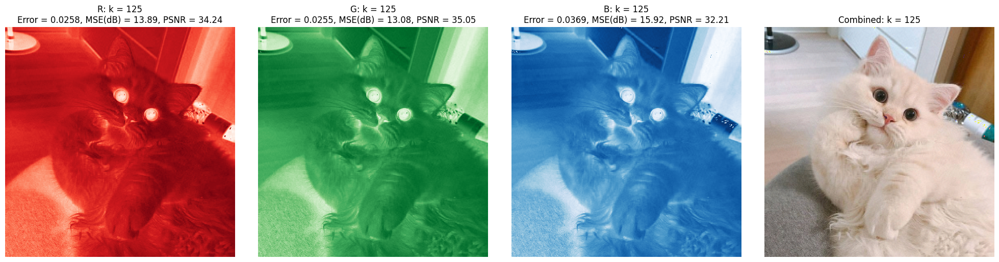

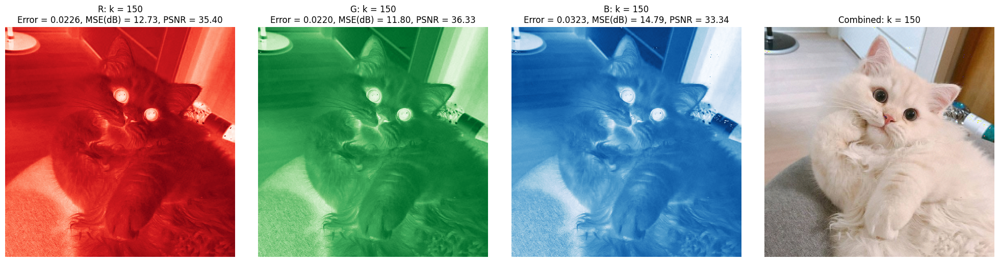

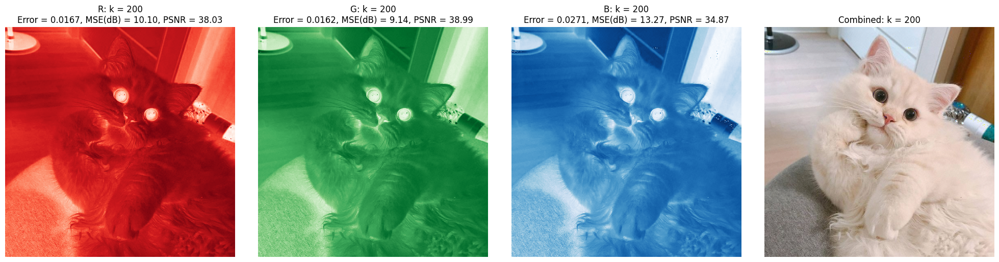

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# Step 1: Specify the image URL
img_url = 'https://i.pinimg.com/564x/4d/1a/1b/4d1a1b004d1e43cf656b43583c53cbf0.jpg'  # replace with your image URL

# Step 2: Load the image from the URL
response = requests.get(img_url)
img = Image.open(BytesIO(response.content))

# Step 3: Split the image into the Red, Green, and Blue channels
r, g, b = img.split()

# Step 4: Convert the color channels into numpy arrays
r_array = np.array(r, dtype=np.float32)
g_array = np.array(g, dtype=np.float32)
b_array = np.array(b, dtype=np.float32)

# Step 5: Manual Singular Value Decomposition (SVD)
def manual_svd(matrix):
    # Calculate covariance matrix
    covariance_matrix = np.dot(matrix.T, matrix)

    # Calculate eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)
    eigenvalues[eigenvalues < 0] = 0

    # Sort eigenvalues in descending order
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    # Calculate singular values and singular vectors
    singular_values = np.sqrt(eigenvalues)
    singular_vectors = np.dot(matrix, eigenvectors)

    # Normalize singular vectors
    singular_vectors = singular_vectors / np.linalg.norm(singular_vectors, axis=0)

    return singular_vectors, singular_values, eigenvectors.T

# Step 6: Reconstruct the image using the top k singular values for each channel
def reconstruct_image(matrix, k):
    Ur, Sr, Vtr = manual_svd(matrix[:, :, 0])  # Red channel
    Ug, Sg, Vtg = manual_svd(matrix[:, :, 1])  # Green channel
    Ub, Sb, Vtb = manual_svd(matrix[:, :, 2])  # Blue channel

    compressed_r = np.dot(Ur[:, :k], np.dot(np.diag(Sr[:k]), Vtr[:k, :]))
    compressed_g = np.dot(Ug[:, :k], np.dot(np.diag(Sg[:k]), Vtg[:k, :]))
    compressed_b = np.dot(Ub[:, :k], np.dot(np.diag(Sb[:k]), Vtb[:k, :]))

    compressed_image = np.stack((compressed_r, compressed_g, compressed_b), axis=-1)
    compressed_image = np.array(compressed_image)  # Convert to numpy array
    compressed_image = compressed_image.astype(np.uint8)  # Convert data type to uint8

    return compressed_image, Ur, Sr, Vtr, Ug, Sg, Vtg, Ub, Sb, Vtb  # Return compressed image and matrices


print("Rank of original red matrix: ", np.linalg.matrix_rank(r_array))
print("Rank of original green matrix: ", np.linalg.matrix_rank(g_array))
print("Rank of original blue matrix: ", np.linalg.matrix_rank(b_array))

# Step 7: Display the original and compressed images for comparison
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Original color channels and image
axs[0].imshow(r, cmap='Reds')
axs[0].set_title('Original R Channel')
axs[0].axis('off')
axs[1].imshow(g, cmap='Greens')
axs[1].set_title('Original G Channel')
axs[1].axis('off')
axs[2].imshow(b, cmap='Blues')
axs[2].set_title('Original B Channel')
axs[2].axis('off')
axs[3].imshow(img)
axs[3].set_title('Original Image')
axs[3].axis('off')

plt.show()

k_values = [1, 5, 10, 15, 25, 50, 75, 100, 125, 150, 200]  # Updated k values
for i, k in enumerate(k_values, start=1):
    img_compressed, Ur, Sr, Vtr, Ug, Sg, Vtg, Ub, Sb, Vtb = reconstruct_image(
        np.stack((r_array, g_array, b_array), axis=-1), k
    )

    error_r = np.linalg.norm(r_array - img_compressed[..., 0]) / np.linalg.norm(r_array)
    error_g = np.linalg.norm(g_array - img_compressed[..., 1]) / np.linalg.norm(g_array)
    error_b = np.linalg.norm(b_array - img_compressed[..., 2]) / np.linalg.norm(b_array)

    mse_r = np.sum((r_array - img_compressed[..., 0])**2) / float(r_array.size)
    mse_g = np.sum((g_array - img_compressed[..., 1])**2) / float(g_array.size)
    mse_b = np.sum((b_array - img_compressed[..., 2])**2) / float(b_array.size)

    mse_db_r = 10 * np.log10(mse_r)
    mse_db_g = 10 * np.log10(mse_g)
    mse_db_b = 10 * np.log10(mse_b)

    compression_ratio = (
        r_array.size + g_array.size + b_array.size
    ) / float(
        Ur[:, :k].size + k + Vtr[:k, :].size +
        Ug[:, :k].size + k + Vtg[:k, :].size +
        Ub[:, :k].size + k + Vtb[:k, :].size
    )

    max_pixel_value = 255
    psnr_r = 10 * np.log10((max_pixel_value ** 2) / mse_r)
    psnr_g = 10 * np.log10((max_pixel_value ** 2) / mse_g)
    psnr_b = 10 * np.log10((max_pixel_value ** 2) / mse_b)

    fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # Create 1 row with 4 columns for R, G, B, and combined images

    axs[0].imshow(img_compressed[..., 0], cmap='Reds')
    axs[0].set_title('R: k = {}\nError = {:.4f}, MSE(dB) = {:.2f}, PSNR = {:.2f}'.format(k, error_r, mse_db_r, psnr_r))

    axs[1].imshow(img_compressed[..., 1], cmap='Greens')
    axs[1].set_title('G: k = {}\nError = {:.4f}, MSE(dB) = {:.2f}, PSNR = {:.2f}'.format(k, error_g, mse_db_g, psnr_g))

    axs[2].imshow(img_compressed[..., 2], cmap='Blues')
    axs[2].set_title('B: k = {}\nError = {:.4f}, MSE(dB) = {:.2f}, PSNR = {:.2f}'.format(k, error_b, mse_db_b, psnr_b))

    axs[3].imshow(img_compressed)
    axs[3].set_title('Combined: k = {}'.format(k))

    for ax in axs:
        ax.axis('off')  # Hide axes

    plt.tight_layout()
    plt.show()

Pengukuran Performa pada Image Compressing RGB

            Hasil Kompresi dengan Nilai k pada Gambar Berwarna Merah            
+-----+----------------------+--------------------+--------------------+--------------------+
|  k  |        Error         |      MSE(dB)       | Compression Ratio  |      PSNR(dB)      |
+-----+----------------------+--------------------+--------------------+--------------------+
|  1  | 0.06721993287404378  | 10.580940640515866 | 281.75022143489815 | 5.462660562377168  |
|  5  | 0.038397543132305145 | 8.959643454734833  | 56.350044286979625 | 7.083957748158201  |
| 10  | 0.023345373570919037 | 7.518959167478965  | 28.175022143489812 | 8.524642035414068  |
| 15  | 0.01984678829709689  | 7.048888411996539  | 18.783348095659875 | 8.994712790896495  |
| 25  | 0.016904596239328384 | 6.584319067119385  | 11.270008857395926 | 9.459282135773648  |
| 50  | 0.013514276593923569 | 5.936239172914598  | 5.635004428697963  | 10.107362029978438 |
| 75  | 0.011470122883717218 | 5.461407579767585  | 3.756669619131975  | 

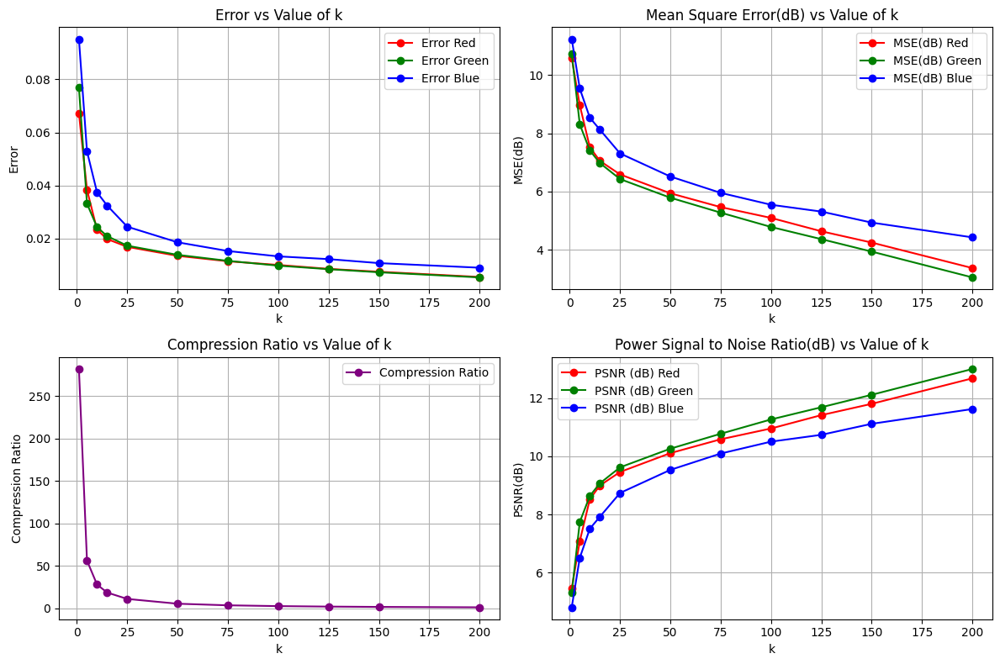

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
from tabulate import tabulate  # Import tabulate

# Initialize lists to store results
table_data_0 = []
table_data_1 = []
table_data_2 = []
headers = ["k", "Error", "MSE(dB)", "Compression Ratio", "PSNR(dB)"]

# Display the error, plot, mean square error (dB), and compression ratio for different values of k
k_values = [1, 5, 10, 15, 25, 50, 75, 100, 125, 150, 200]  # Updated k values
for k in k_values:
    img_compressed, Ur, Sr, Vtr, Ug, Sg, Vtg, Ub, Sb, Vtb = reconstruct_image(
        np.stack((r_array, g_array, b_array), axis=-1), k
    )

    error_r = np.linalg.norm(r_array - img_compressed[..., 0]) / np.linalg.norm(r_array)
    error_g = np.linalg.norm(g_array - img_compressed[..., 1]) / np.linalg.norm(g_array)
    error_b = np.linalg.norm(b_array - img_compressed[..., 2]) / np.linalg.norm(b_array)

    mse_r = np.sum((r_array - img_compressed[..., 0])**2) / float(r_array.size)
    mse_g = np.sum((g_array - img_compressed[..., 1])**2) / float(g_array.size)
    mse_b = np.sum((b_array - img_compressed[..., 2])**2) / float(b_array.size)

    mse_db_r = 10 * np.log10(mse_r)
    mse_db_g = 10 * np.log10(mse_g)
    mse_db_b = 10 * np.log10(mse_b)

    compression_ratio = (
        r_array.size + g_array.size + b_array.size
    ) / float(
        Ur[:, :k].size + k + Vtr[:k, :].size +
        Ug[:, :k].size + k + Vtg[:k, :].size +
        Ub[:, :k].size + k + Vtb[:k, :].size
    )

    max_pixel_value = 255
    psnr_r = 10 * np.log10((max_pixel_value ** 2) / mse_r)
    psnr_g = 10 * np.log10((max_pixel_value ** 2) / mse_g)
    psnr_b = 10 * np.log10((max_pixel_value ** 2) / mse_b)

    # Append the results to the table_data list
    table_data_0.append([k, (error_r) / 3, (mse_db_r) / 3, compression_ratio, (psnr_r) / 3])
    table_data_1.append([k, (error_g) / 3, (mse_db_g) / 3, compression_ratio, (psnr_g) / 3])
    table_data_2.append([k, (error_b) / 3, (mse_db_b) / 3, compression_ratio, (psnr_b) / 3])

# Display the table
title_0 = "Hasil Kompresi dengan Nilai k pada Gambar Berwarna Merah"
print(title_0.center(80))
print(tabulate(table_data_0, headers=headers, tablefmt="pretty"))
title_1 = "Hasil Kompresi dengan Nilai k pada Gambar Berwarna Hijau"
print(title_1.center(80))
print(tabulate(table_data_1, headers=headers, tablefmt="pretty"))
title_2 = "Hasil Kompresi dengan Nilai k pada Gambar Berwarna Biru"
print(title_2.center(80))
print(tabulate(table_data_2, headers=headers, tablefmt="pretty"))

# Convert table_data to a NumPy array for easier indexing
table_data_0 = np.array(table_data_0)
table_data_1 = np.array(table_data_1)
table_data_2 = np.array(table_data_2)

# Plotting

# Plot Error vs k
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(table_data_0[:, 0], table_data_0[:, 1], marker='o', label='Error Red', color='red')
plt.plot(table_data_1[:, 0], table_data_1[:, 1], marker='o', label='Error Green', color='green')
plt.plot(table_data_2[:, 0], table_data_2[:, 1], marker='o', label='Error Blue', color='blue')
plt.title('Error vs Value of k')
plt.xlabel('k')
plt.ylabel('Error')
plt.grid(True)
plt.legend()


# Plot MSE(dB) vs k
plt.subplot(2, 2, 2)
plt.plot(table_data_0[:, 0], table_data_0[:, 2], marker='o', label='MSE(dB) Red', color='red')
plt.plot(table_data_1[:, 0], table_data_1[:, 2], marker='o', label='MSE(dB) Green', color='green')
plt.plot(table_data_2[:, 0], table_data_2[:, 2], marker='o', label='MSE(dB) Blue', color='blue')
plt.title('Mean Square Error(dB) vs Value of k')
plt.xlabel('k')
plt.ylabel('MSE(dB)')
plt.grid(True)
plt.legend()

# Plot Compression Ratio vs k
plt.subplot(2, 2, 3)
plt.plot(table_data_0[:, 0], table_data_0[:, 3], marker='o', label='Compression Ratio', color='purple')
plt.title('Compression Ratio vs Value of k')
plt.xlabel('k')
plt.ylabel('Compression Ratio')
plt.grid(True)
plt.legend()

# Plot PSNR(dB) vs k
plt.subplot(2, 2, 4)
plt.plot(table_data_0[:, 0], table_data_0[:, 4], marker='o', label='PSNR (dB) Red', color='red')
plt.plot(table_data_1[:, 0], table_data_1[:, 4], marker='o', label='PSNR (dB) Green', color='green')
plt.plot(table_data_2[:, 0], table_data_2[:, 4], marker='o', label='PSNR (dB) Blue', color='blue')
plt.title('Power Signal to Noise Ratio(dB) vs Value of k')
plt.xlabel('k')
plt.ylabel('PSNR(dB)')
plt.grid(True)
plt.legend()

# Adjust layout for better visualization
plt.tight_layout()

# Show the plots
plt.show()

Mendownload Gambar Berwarna

In [ ]:
# Save the original colored image
img.save('original_color.png')

# Define the k value
k = 200

# Reconstruct each color channel using the top k singular values
r_compressed = np.dot(Ur[:, :k], np.dot(np.diag(Sr[:k]), Vtr[:k, :]))
g_compressed = np.dot(Ug[:, :k], np.dot(np.diag(Sg[:k]), Vtg[:k, :]))
b_compressed = np.dot(Ub[:, :k], np.dot(np.diag(Sb[:k]), Vtb[:k, :]))

# Merge the compressed color channels back into a single image
img_compressed = Image.merge('RGB', (Image.fromarray(r_compressed.clip(0, 255).astype(np.uint8)),
                                    Image.fromarray(g_compressed.clip(0, 255).astype(np.uint8)),
                                    Image.fromarray(b_compressed.clip(0, 255).astype(np.uint8))))

# Save the compressed colored image
img_compressed.save('compressed_color_{}.png'.format(k))